In [1]:
import tensorflow as tf

print("TensorFlow version:", tf.__version__)
print("CUDA enabled:", tf.test.is_built_with_cuda())
print("GPU available:", tf.config.list_physical_devices('GPU'))


TensorFlow version: 2.15.0
CUDA enabled: False
GPU available: []


In [2]:
# For data manipulation
import numpy as np
import pandas as pd

# For data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Ingore the warnings
import warnings
warnings.filterwarnings('ignore')

# DL Libraries
import os
import random
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.utils import image_dataset_from_directory
from keras.optimizers import Adam

In [4]:
# Load the image dataset from the directory using utils
# ds = image_dataset_from_directory('E:\DataScience Codanics\Kaggle\LAPTOP Items classification\PC Part Classification\Data')

data_directory = r'C:\Users\GAURAV DEV\Music\Unified Mentor Projects\Animal Classification\dataset'

dataset = keras.utils.image_dataset_from_directory(
    directory = data_directory,
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(256, 256),
)

print(f"Dataset loaded from: {data_directory}")
print(f"Number of batches in dataset: {tf.data.experimental.cardinality(dataset).numpy()}")

Found 1944 files belonging to 15 classes.
Dataset loaded from: C:\Users\GAURAV DEV\Music\Unified Mentor Projects\Animal Classification\dataset
Number of batches in dataset: 61


In [5]:
dataset_size = len(dataset)
train_size = int(0.8 * dataset_size)
val_size = dataset_size - train_size

train_ds = dataset.take(train_size)
val_ds = dataset.skip(train_size).take(val_size)

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [6]:
# this function is sepreted label and images 
def dataset_to_tensors(dataset):
    images = []
    labels = []
    for img, lbl in dataset.unbatch():
        images.append(img.numpy())
        labels.append(lbl.numpy())
    return tf.convert_to_tensor(images), tf.convert_to_tensor(labels)

In [7]:
# x_train, y_train, x_test, y_test  dividing
x_train, y_train = dataset_to_tensors(train_ds) #dataset_to_tensors is function where we seprate  images and label
x_test, y_test = dataset_to_tensors(val_ds)

[]

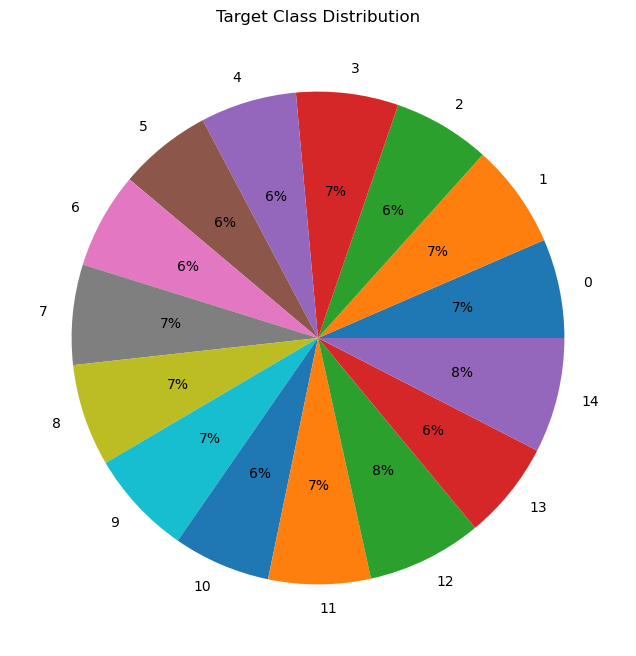

In [8]:
import os
unique, count=np.unique(y_train, return_counts=True)
plt.figure(figsize=(10, 8))
plt.pie(count, labels=unique, autopct='%.0f%%')
plt.title('Target Class Distribution')
plt.plot()

In [9]:
# Creating a function to visualize the images

def visualize_images(path, num_images=5):

    # Get a list of image filenames
    image_filenames = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))]

    #if not image_filenames:
        #raise ValueError("No images found in the specified path")

    # Select random images
    selected_images = random.sample(image_filenames, min(num_images, len(image_filenames)))

    # Create a figure and axes
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3), facecolor='white')
    
    # Display each image
    for i, image_filename in enumerate(selected_images):
        # Load image
        image_path = os.path.join(path, image_filename)
        image = plt.imread(image_path)

        # Display image
        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(image_filename)  # Set image filename as title

    # Adjust layout and display
    plt.tight_layout()
    plt.show()

In [10]:
# Extrating the class labels
classes = dataset.class_names
print(f'{classes}')

['Bear', 'Bird', 'Cat', 'Cow', 'Deer', 'Dog', 'Dolphin', 'Elephant', 'Giraffe', 'Horse', 'Kangaroo', 'Lion', 'Panda', 'Tiger', 'Zebra']


BEAR


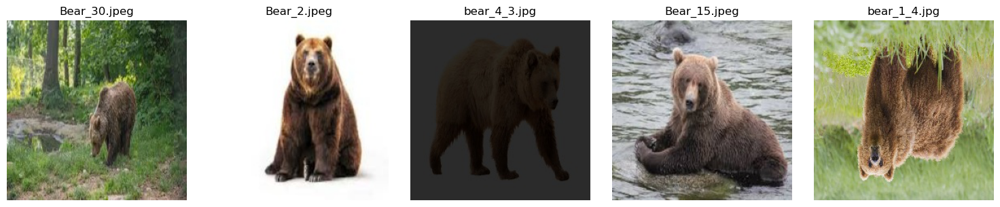

BIRD


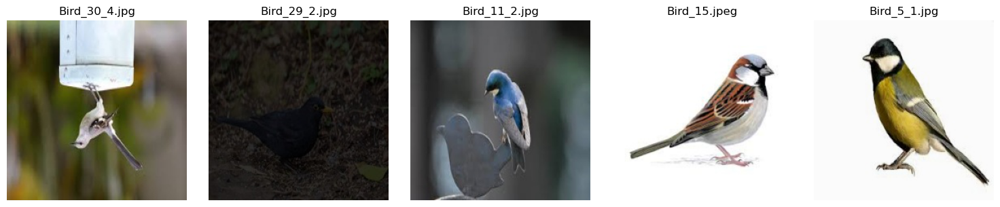

CAT


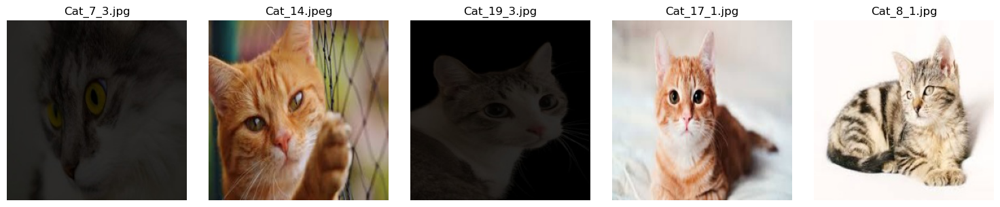

COW


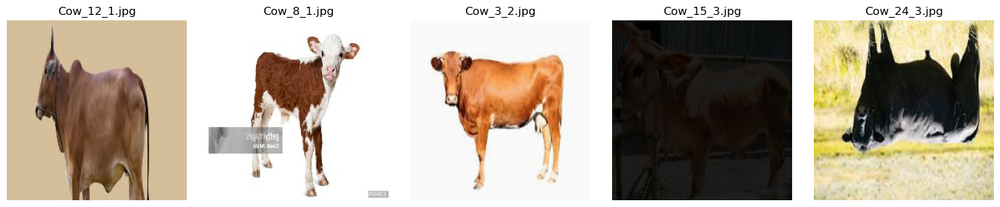

DEER


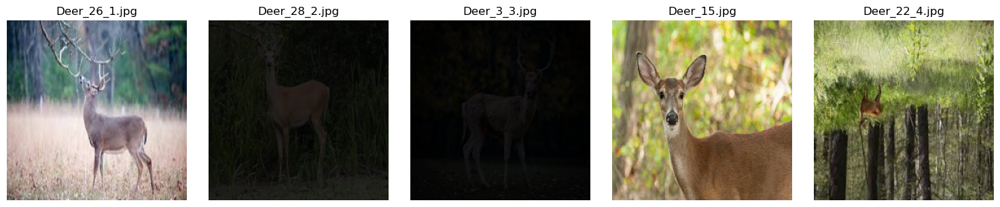

DOG


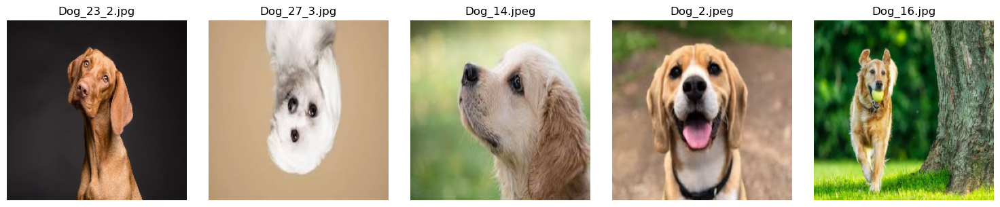

DOLPHIN


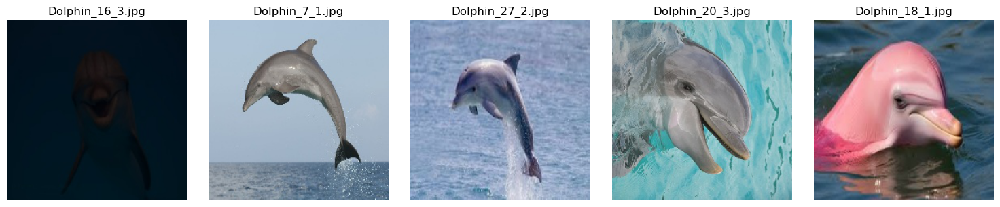

ELEPHANT


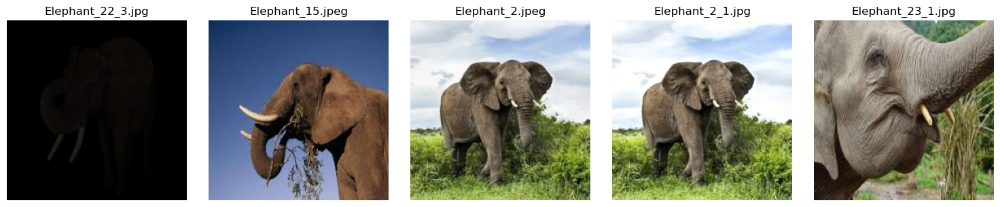

GIRAFFE


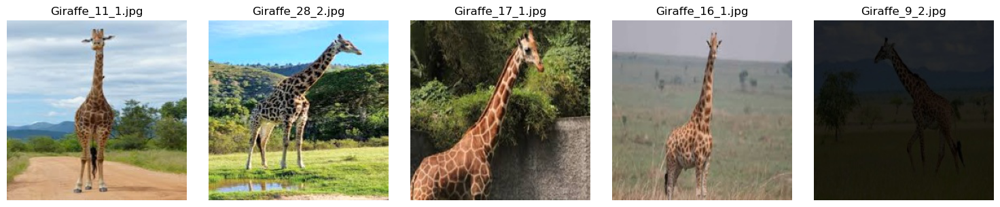

HORSE


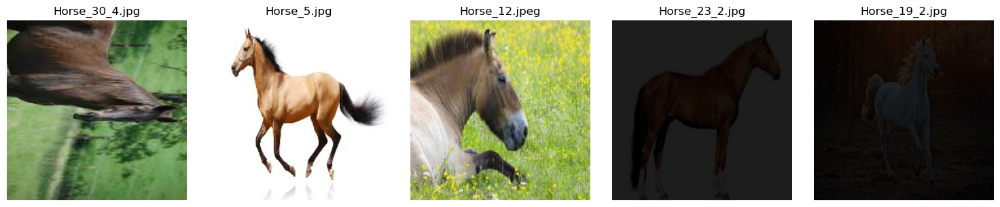

KANGAROO


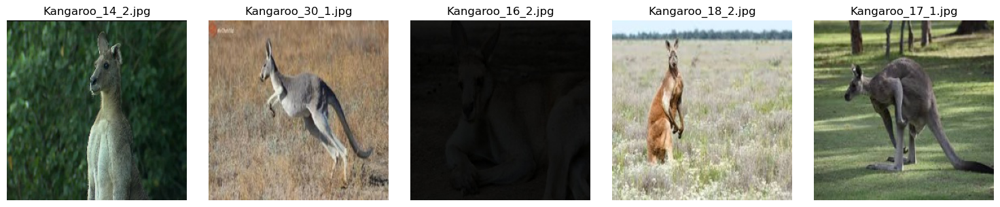

LION


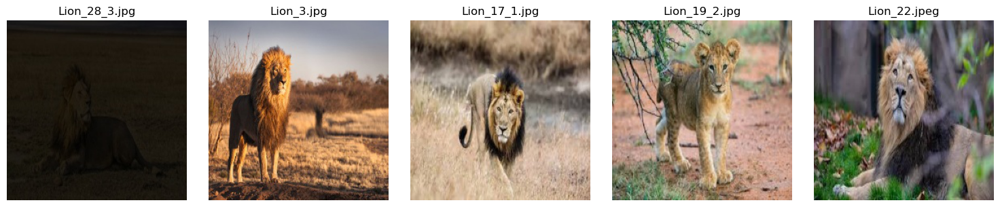

PANDA


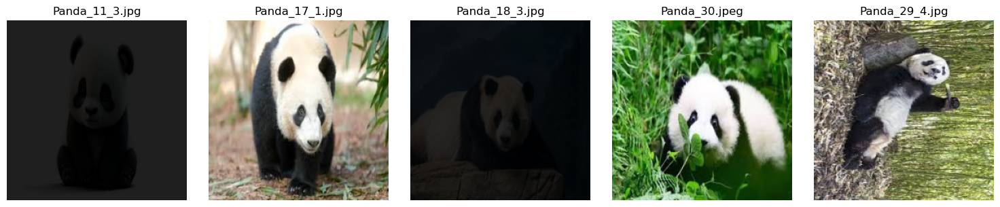

TIGER


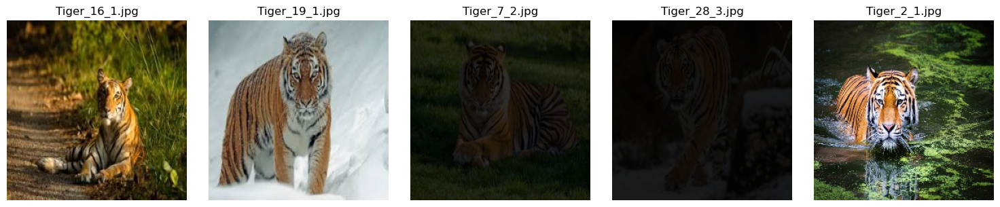

ZEBRA


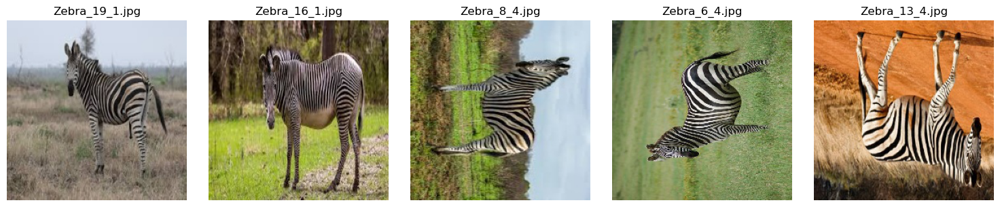

In [12]:
import os
# Iterating through each class to plot its images
for label in classes:
    # Specify the path containing the images to visualize
    path_to_visualize = os.path.join(r'C:\Users\GAURAV DEV\Music\Unified Mentor Projects\Animal Classification\dataset',label)

    # Visualize 5 random images
    print(label.upper())
    visualize_images(path_to_visualize, num_images=5)

# Min-Max Scaling

In [13]:
# Convert the data type of the images to float32
x_train = tf.cast(x_train, tf.float32)  # tf.cast is used to convert the image tensors to float32.
x_test = tf.cast(x_test, tf.float32)

# Normalize the pixel values to a range between 0 and 1
x_train /= 255.0
x_test /= 255.0  #The pixel values of the images are normalized by dividing by 255.0.

# Print the shapes of the original training data and labels
print("X_train shape: {} \nY_train shape: {}".format(x_train.shape, y_train.shape))
print("X_test shape: {} \nY_test shape: {}".format(x_test.shape, y_test.shape))

X_train shape: (1536, 256, 256, 3) 
Y_train shape: (1536,)
X_test shape: (408, 256, 256, 3) 
Y_test shape: (408,)


# Processing the Target variable

In [14]:
from tensorflow.keras.utils import to_categorical
# Convert class vectors to binary class matrices / one-hot encoding
y_train = to_categorical(y_train, 15)
y_test = to_categorical(y_test, 15)

In [15]:
y_train[3]

array([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
      dtype=float32)

Define CNN Architecture

In [16]:
# Define the CNN model
model = Sequential()
# Conv2D layer with 32 filters, kernel size 3x3, input shape (32, 32, 3)
# Input size: 32x32x3, Kernel size: 3x3, Number of kernels: 32, Output size: 30x30x32. [input_size-kernel]+1
model.add(Conv2D(92, (3, 3), activation='relu', input_shape=(256, 256, 3)))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 15x15x32
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

#model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 15x15x32, Kernel size: 3x3, Number of kernels: 64, Output size: 13x13x64
model.add(Conv2D(84, (3, 3), activation='relu'))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 6x6x64
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 15x15x32, Kernel size: 3x3, Number of kernels: 64, Output size: 13x13x64
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 6x6x64
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 15x15x32, Kernel size: 3x3, Number of kernels: 64, Output size: 13x13x64
model.add(Conv2D(54, (3, 3), activation='relu'))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 6x6x64
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 15x15x32, Kernel size: 3x3, Number of kernels: 64, Output size: 13x13x64
model.add(Conv2D(54, (3, 3), activation='relu'))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 6x6x64
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 15x15x32, Kernel size: 3x3, Number of kernels: 64, Output size: 13x13x64
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
# MaxPooling2D layer with pool size 2x2
# Output size: 6x6x64
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))
# Conv2D layer with 64 filters, kernel size 3x3
# Input size: 6x6x64, Kernel size: 3x3, Number of kernels: 64, Output size: 4x4x64

# Flatten layer
# Output size: 1024
model.add(Flatten())
# Dense layer with 64 units
# Input size: 1024, Output size: 64
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
# Dense layer with 15 units (output layer)
# Input size: 256, Output size: 15

model.add(Dense(15, activation='softmax'))

In [17]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 92)      2576      
                                                                 
 batch_normalization (Batch  (None, 254, 254, 92)      368       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 92)      0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 127, 127, 92)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 84)      69636     
                                                                 
 batch_normalization_1 (Bat  (None, 125, 125, 84)      3

In [18]:
#from tensorflow.keras.optimizers import

In [19]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#other optimizer SGD, RMSprop, Adadelta, Adagrad, Adamax etc
# other loss functions are mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, mean_squared_logarithmic_error, binary_crossentropy

In [20]:
# Train the model
history = model.fit(x_train, y_train, batch_size=32, epochs=120,
          validation_data=(x_test, y_test))

Epoch 1/120


48/48 [==============================] - 166s 3s/step - loss: 3.8295 - accuracy: 0.0788 - val_loss: 2.7260 - val_accuracy: 0.1029
Epoch 2/120
48/48 [==============================] - 168s 3s/step - loss: 3.4380 - accuracy: 0.1055 - val_loss: 2.9286 - val_accuracy: 0.0833
Epoch 3/120
48/48 [==============================] - 165s 3s/step - loss: 3.2075 - accuracy: 0.1211 - val_loss: 3.1652 - val_accuracy: 0.0613
Epoch 4/120
48/48 [==============================] - 174s 4s/step - loss: 3.0476 - accuracy: 0.1328 - val_loss: 3.1402 - val_accuracy: 0.0686
Epoch 5/120
48/48 [==============================] - 168s 3s/step - loss: 2.8862 - accuracy: 0.1621 - val_loss: 3.3063 - val_accuracy: 0.0613
Epoch 6/120
48/48 [==============================] - 165s 3s/step - loss: 2.7458 - accuracy: 0.1901 - val_loss: 3.4959 - val_accuracy: 0.0613
Epoch 7/120
48/48 [==============================] - 188s 4s/step - loss: 2.5985 - accuracy: 0.2096 - val_loss: 3.4425 - val_accuracy: 0.0662
Epoc

48/48 [==============================] - 184s 4s/step - loss: 1.0623 - accuracy: 0.6510 - val_loss: 1.1646 - val_accuracy: 0.6422
Epoch 56/120
48/48 [==============================] - 191s 4s/step - loss: 1.0662 - accuracy: 0.6445 - val_loss: 1.0150 - val_accuracy: 0.6593
Epoch 57/120
48/48 [==============================] - 191s 4s/step - loss: 1.0531 - accuracy: 0.6562 - val_loss: 0.9792 - val_accuracy: 0.6912
Epoch 58/120
48/48 [==============================] - 208s 4s/step - loss: 0.9998 - accuracy: 0.6725 - val_loss: 1.1385 - val_accuracy: 0.6422
Epoch 59/120
48/48 [==============================] - 187s 4s/step - loss: 0.9696 - accuracy: 0.6758 - val_loss: 0.9446 - val_accuracy: 0.6814
Epoch 60/120
48/48 [==============================] - 184s 4s/step - loss: 0.9846 - accuracy: 0.6803 - val_loss: 0.9738 - val_accuracy: 0.6740
Epoch 61/120
48/48 [==============================] - 186s 4s/step - loss: 0.9183 - accuracy: 0.6973 - val_loss: 0.7516 - val_accuracy: 0.7721
Epoch 62/120

48/48 [==============================] - 172s 4s/step - loss: 0.3498 - accuracy: 0.8854 - val_loss: 0.5265 - val_accuracy: 0.8480
Epoch 113/120
48/48 [==============================] - 177s 4s/step - loss: 0.3951 - accuracy: 0.8815 - val_loss: 0.4560 - val_accuracy: 0.8676
Epoch 114/120
48/48 [==============================] - 175s 4s/step - loss: 0.3694 - accuracy: 0.8730 - val_loss: 0.5047 - val_accuracy: 0.8456
Epoch 115/120
48/48 [==============================] - 183s 4s/step - loss: 0.3346 - accuracy: 0.8971 - val_loss: 0.5094 - val_accuracy: 0.8407
Epoch 116/120
48/48 [==============================] - 183s 4s/step - loss: 0.3427 - accuracy: 0.8893 - val_loss: 0.4777 - val_accuracy: 0.8652
Epoch 117/120
48/48 [==============================] - 174s 4s/step - loss: 0.3218 - accuracy: 0.8997 - val_loss: 0.6078 - val_accuracy: 0.8309
Epoch 118/120
48/48 [==============================] - 170s 4s/step - loss: 0.3536 - accuracy: 0.8809 - val_loss: 0.4658 - val_accuracy: 0.8725
Epoch 

In [21]:
# Evaluate the model
loss, accuracy = model.evaluate(x_test, y_test)
print('Test accuracy:', accuracy)

13/13 [==============================] - 8s 644ms/step - loss: 0.5798 - accuracy: 0.8431
Test accuracy: 0.843137264251709


In [25]:
pred = model.predict(x_test)

13/13 [==============================] - 8s 643ms/step


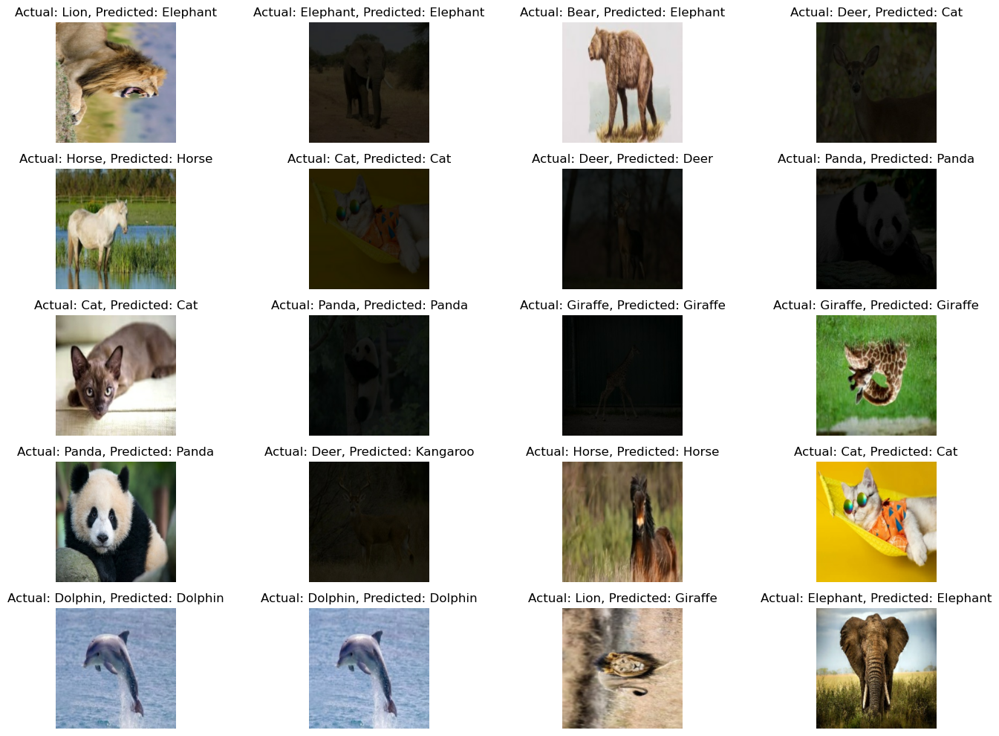

In [26]:
num_images_to_display = 20
num_columns = 4
num_rows = (num_images_to_display + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 10))
for i, ax in enumerate(axes.flat):
    if i < num_images_to_display:
        ax.imshow(x_test[i])
        actual_label = classes[np.argmax(y_test[i])]
        predicted_label = classes[np.argmax(pred[i])]
        ax.set_title(f"Actual: {actual_label}, Predicted: {predicted_label}")
        ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

# Plotting the Graph

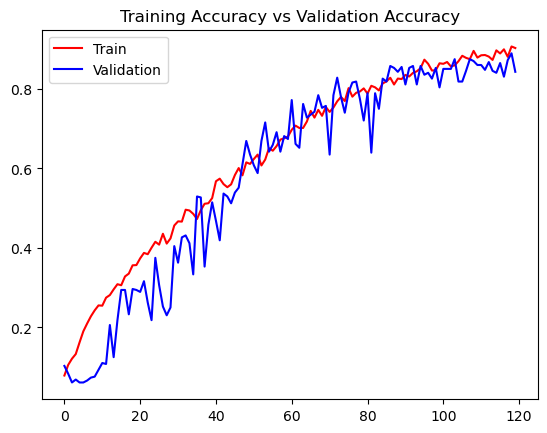

In [27]:
# Plotting the graph of Accuracy and Validation Accuracy
plt.title('Training Accuracy vs Validation Accuracy')

plt.plot(history.history['accuracy'], color='red',label='Train')
plt.plot(history.history['val_accuracy'], color='blue',label='Validation')

plt.legend()

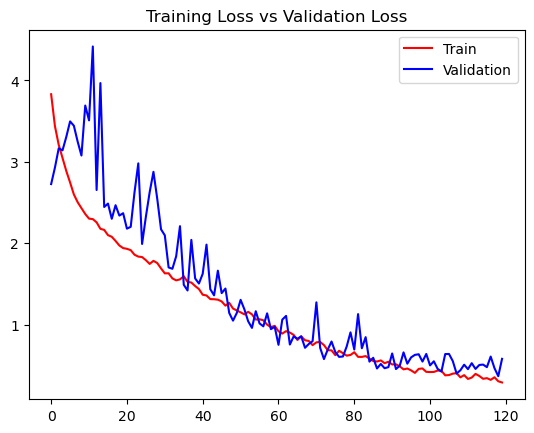

In [28]:
# Plotting the graph of Accuracy and Validation loss
plt.title('Training Loss vs Validation Loss')

plt.plot(history.history['loss'], color='red',label='Train')
plt.plot(history.history['val_loss'], color='blue',label='Validation')

plt.legend()